In [1]:
import numpy as np
import torch
from torch.utils.data import DataLoader, Dataset
import IPython.display as ipd
from scipy.io.wavfile import read
import torch.nn as nn

In [2]:
# functions used in the whole lab
def read_sound(file):
  """ read a mono wav sound file, assuming is mono, and convert it to a floating point array
    Args:
      file (str): File name
    Returns:
      sound_array (numpy.array): Array of samples as floating point values between -1 and 1
      sampling_rate (int): Sampling rate
  """
  # read sound file
  sampling_rate, x = read(file)
  # convert to floating point values between -1 and 1, assuming x are 16 bit integers
  sound_array = np.float32(x) / 2**15
  return sound_array, sampling_rate

def display_sound(sound_array, sampling_rate=44100):
  """ Display signal sound_array
    Args:
      sound_array (numpy.array): Array of samples
      sampling_rate (int): Sampling rate
  """
  # plot the waveform of the sound
  plt.figure(0, figsize=(10, 4))
  time_indexes = np.linspace(0, sound_array.size/sampling_rate, sound_array.size)
  plt.plot(time_indexes, sound_array)
  plt.xlabel('time (seconds)')
  plt.ylabel('amplitude')
  plt.show()
  # play the sound
  ipd.display(ipd.Audio(data=sound_array, rate=sampling_rate))

In [3]:
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, Dataset
import matplotlib.pyplot as plt
import soundfile as sf

# Dataset for loading and segmenting audio
class AudioDataset(Dataset):
    def __init__(self, signal, segment_length=16000):
        self.signal = signal
        self.segment_length = segment_length

    def __len__(self):
        return len(self.signal) // self.segment_length

    def __getitem__(self, idx):
        start = idx * self.segment_length
        end = start + self.segment_length
        return self.signal[start:end]

# Autoencoder architecture with Conv1D and ConvTranspose1D
class ConvAutoencoder(nn.Module):
    def __init__(self):
        super(ConvAutoencoder, self).__init__()

        # Encoder
        self.encoder = nn.Sequential(
            nn.Conv1d(in_channels=1, out_channels=1024, kernel_size=2048, stride=512, padding=1023, bias=True),
            nn.ReLU(),
            nn.Conv1d(in_channels=1024, out_channels=256, kernel_size=1, stride=1, padding=0, bias=True),
            nn.ReLU(),
            nn.Conv1d(in_channels=256, out_channels=64, kernel_size=1, stride=1, padding=0, bias=True),
            nn.ReLU()
        )

        # Decoder
        self.decoder = nn.Sequential(
            nn.ConvTranspose1d(in_channels=64, out_channels=256, kernel_size=1, stride=1, padding=0, bias=True),
            nn.ReLU(),
            nn.ConvTranspose1d(in_channels=256, out_channels=1024, kernel_size=1, stride=1, padding=0, bias=True),
            nn.ReLU(),
            nn.ConvTranspose1d(in_channels=1024, out_channels=1, kernel_size=2048, stride=512, padding=1023, bias=True)
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x

def train_autoencoder(model, data_loader, num_epochs, device):
    criterion = nn.MSELoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

    # To store loss values for plotting later
    training_loss = []

    for epoch in range(num_epochs):
        running_loss = 0.0

        # Switch model to training mode
        model.train()

        for i, batch in enumerate(data_loader):
            batch = batch.unsqueeze(1).to(device)  # Add channel dimension [B, 1, L]
            optimizer.zero_grad()

            # Forward pass
            outputs = model(batch)
            loss = criterion(outputs, batch[..., :outputs.size(-1)])

            # Backward pass
            loss.backward()
            optimizer.step()

            running_loss += loss.item()

        # Calculate average loss over the epoch
        avg_loss = running_loss / len(data_loader)
        training_loss.append(avg_loss)

        # Print progress at every 100 epochs
        if epoch % 10 == 0:
            print(f'Epoch [{epoch + 1}/{num_epochs}], Loss: {avg_loss:.6f}')

        # Optional: Visualize original vs reconstructed at every few epochs
        if epoch % 100 == 0:  # Plot every 100 epochs
            visualize_reconstruction(model, data_loader, device)

    # Plot loss over epochs
    plt.figure(figsize=(10, 5))
    plt.plot(range(1, num_epochs + 1), training_loss, label='Training Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss (MSE)')
    plt.title('Training Loss over Time')
    plt.legend()
    plt.grid(True)
    plt.show()

def visualize_reconstruction(model, data_loader, device):
    # Switch model to evaluation mode
    model.eval()

    # Get a batch of data
    with torch.no_grad():
        batch = next(iter(data_loader))
        batch = batch.unsqueeze(1).to(device)  # Add channel dimension [B, 1, L]

        # Get the model's reconstruction of the batch
        recon = model(batch)

    # Convert tensors to numpy for plotting
    original = batch.squeeze().cpu().numpy()
    reconstructed = recon.squeeze().cpu().numpy()

    # Plot original vs reconstructed for first 5 samples in the batch
    num_samples = 5
    fig, axs = plt.subplots(num_samples, 2, figsize=(10, num_samples * 3))

    for i in range(num_samples):
        # Plot original signal
        axs[i, 0].plot(original[i])
        axs[i, 0].set_title(f'Original Signal {i + 1}')
        axs[i, 0].set_xlim([0, len(original[i])])

        # Plot reconstructed signal
        axs[i, 1].plot(reconstructed[i])
        axs[i, 1].set_title(f'Reconstructed Signal {i + 1}')
        axs[i, 1].set_xlim([0, len(reconstructed[i])])

    plt.tight_layout()
    plt.show()

# Encode the audio into its latent representation
def encode_audio(model, audio_signal, device):
    model.eval()
    if isinstance(audio_signal, np.ndarray):
        audio_signal = torch.from_numpy(audio_signal)
    with torch.no_grad():
        audio_signal = audio_signal.unsqueeze(0).unsqueeze(1).to(device)  # [1, 1, L]
        latent = model.encoder(audio_signal)
    return latent

# Decode the latent representation back to the original space
def decode_audio(model, latent_rep, device):
    model.eval()
    with torch.no_grad():
        reconstructed = model.decoder(latent_rep).squeeze().cpu().numpy()
    return reconstructed

# Plot the original and reconstructed audio signals
def plot_signals(original, reconstructed, sample_rate):
    plt.figure(figsize=(10, 4))
    plt.plot(original, label='Original Signal')
    plt.plot(reconstructed, label='Reconstructed Signal', linestyle='dashed')
    plt.legend()
    plt.title('Original vs Reconstructed Audio Signal')
    plt.show()

# Save the reconstructed audio to a file
def save_audio(reconstructed_signal, sample_rate, filename='reconstructed_audio.wav'):
    sf.write(filename, reconstructed_signal, sample_rate)

Epoch [1/1001], Loss: 0.010160


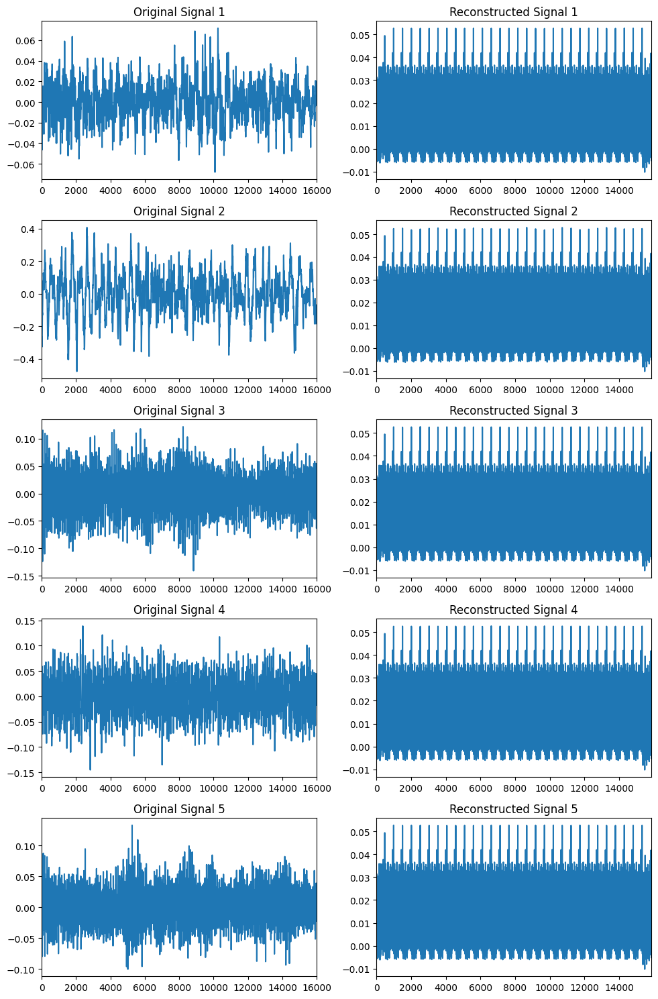

Epoch [11/1001], Loss: 0.009447
Epoch [21/1001], Loss: 0.006782
Epoch [31/1001], Loss: 0.004857
Epoch [41/1001], Loss: 0.004458
Epoch [51/1001], Loss: 0.003979
Epoch [61/1001], Loss: 0.003837
Epoch [71/1001], Loss: 0.003505
Epoch [81/1001], Loss: 0.003225
Epoch [91/1001], Loss: 0.002839
Epoch [101/1001], Loss: 0.002564


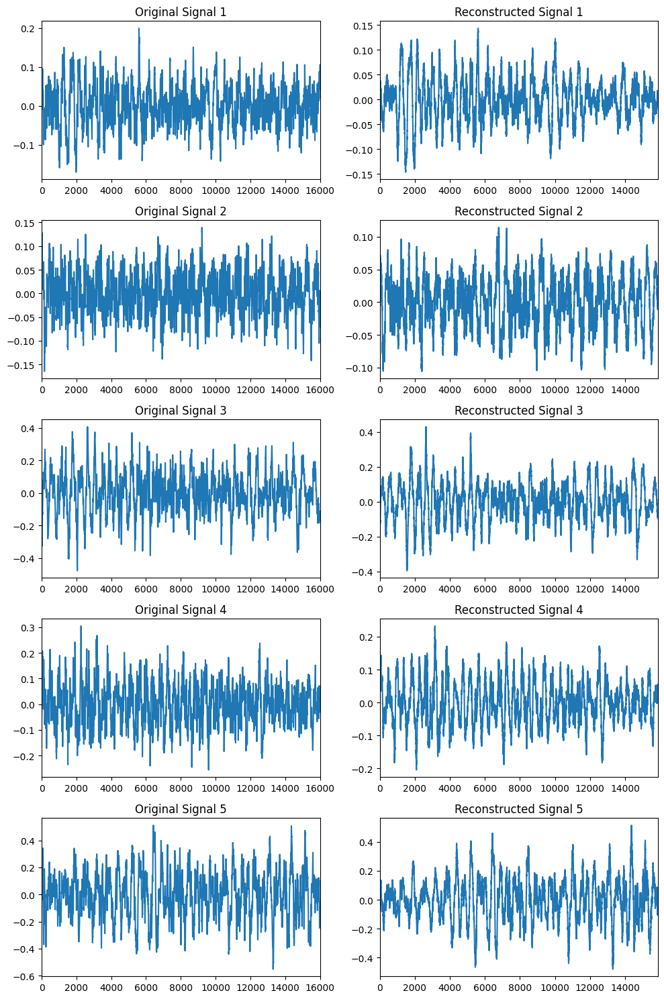

Epoch [111/1001], Loss: 0.002211
Epoch [121/1001], Loss: 0.002058
Epoch [131/1001], Loss: 0.002021
Epoch [141/1001], Loss: 0.001820
Epoch [151/1001], Loss: 0.001658
Epoch [161/1001], Loss: 0.001617
Epoch [171/1001], Loss: 0.001559
Epoch [181/1001], Loss: 0.001428
Epoch [191/1001], Loss: 0.001363
Epoch [201/1001], Loss: 0.001259


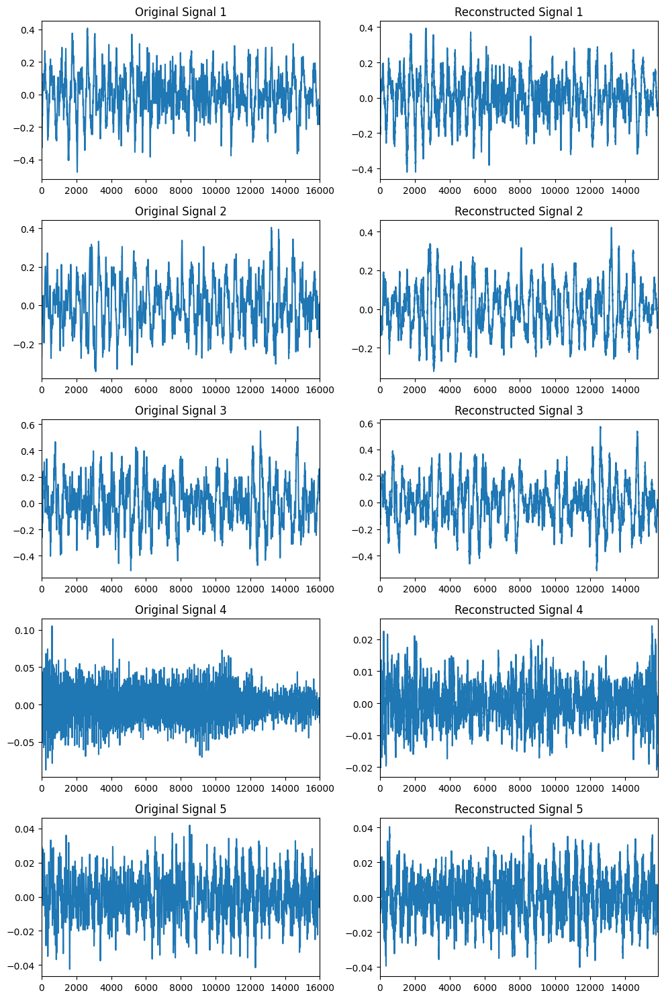

Epoch [211/1001], Loss: 0.001216
Epoch [221/1001], Loss: 0.001143
Epoch [231/1001], Loss: 0.001095
Epoch [241/1001], Loss: 0.000998
Epoch [251/1001], Loss: 0.000956
Epoch [261/1001], Loss: 0.000939
Epoch [271/1001], Loss: 0.000900
Epoch [281/1001], Loss: 0.000870
Epoch [291/1001], Loss: 0.000841
Epoch [301/1001], Loss: 0.000821


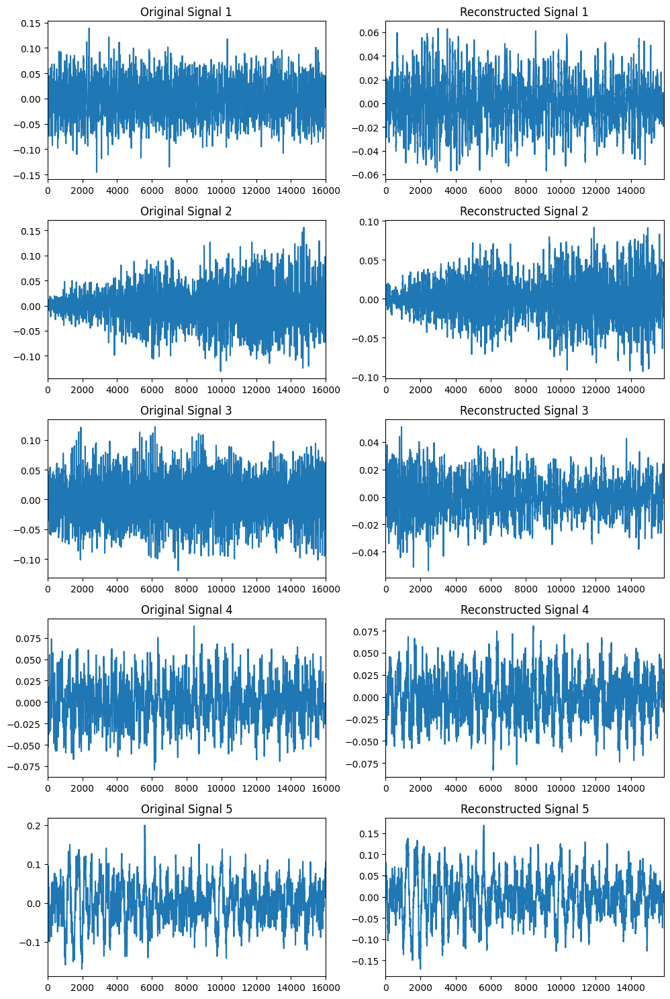

Epoch [311/1001], Loss: 0.000771
Epoch [321/1001], Loss: 0.000738
Epoch [331/1001], Loss: 0.000702
Epoch [341/1001], Loss: 0.000694
Epoch [351/1001], Loss: 0.000655
Epoch [361/1001], Loss: 0.000651
Epoch [371/1001], Loss: 0.000620
Epoch [381/1001], Loss: 0.000621
Epoch [391/1001], Loss: 0.000623
Epoch [401/1001], Loss: 0.000608


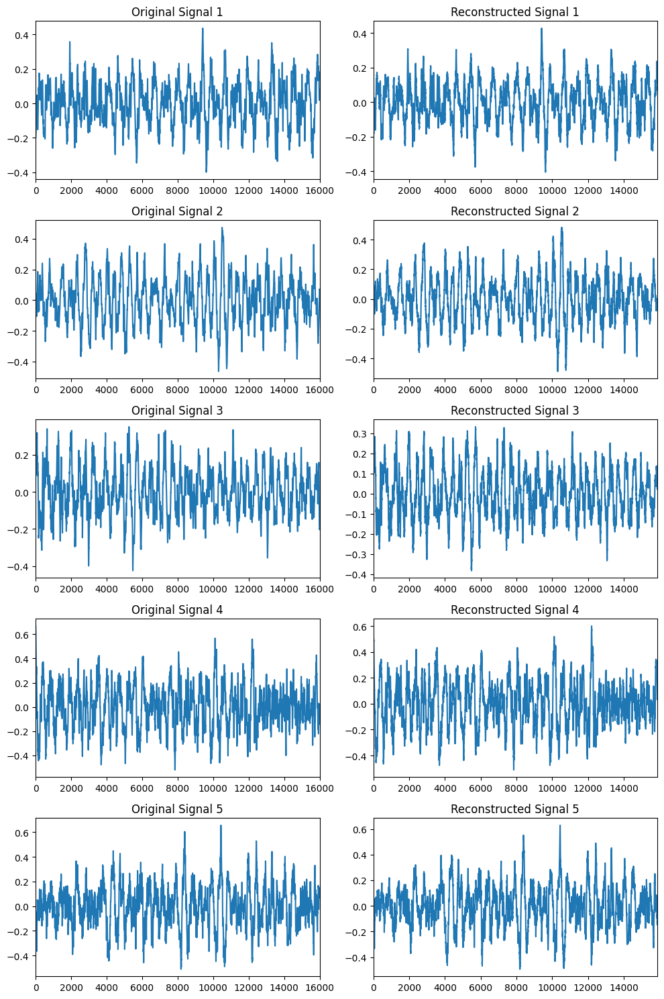

Epoch [411/1001], Loss: 0.000595
Epoch [421/1001], Loss: 0.000591
Epoch [431/1001], Loss: 0.000545
Epoch [441/1001], Loss: 0.000579
Epoch [451/1001], Loss: 0.000555
Epoch [461/1001], Loss: 0.000540
Epoch [471/1001], Loss: 0.000535
Epoch [481/1001], Loss: 0.000495
Epoch [491/1001], Loss: 0.000477
Epoch [501/1001], Loss: 0.000476


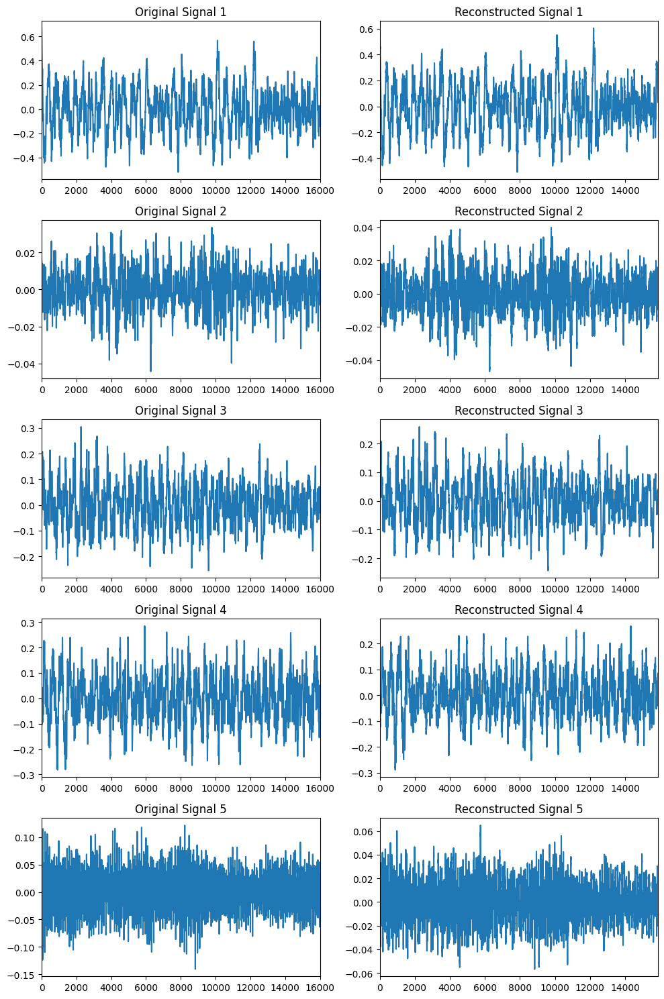

Epoch [511/1001], Loss: 0.000464
Epoch [521/1001], Loss: 0.000451
Epoch [531/1001], Loss: 0.000449
Epoch [541/1001], Loss: 0.000435
Epoch [551/1001], Loss: 0.000428
Epoch [561/1001], Loss: 0.000408
Epoch [571/1001], Loss: 0.000426
Epoch [581/1001], Loss: 0.000403
Epoch [591/1001], Loss: 0.000393
Epoch [601/1001], Loss: 0.000393


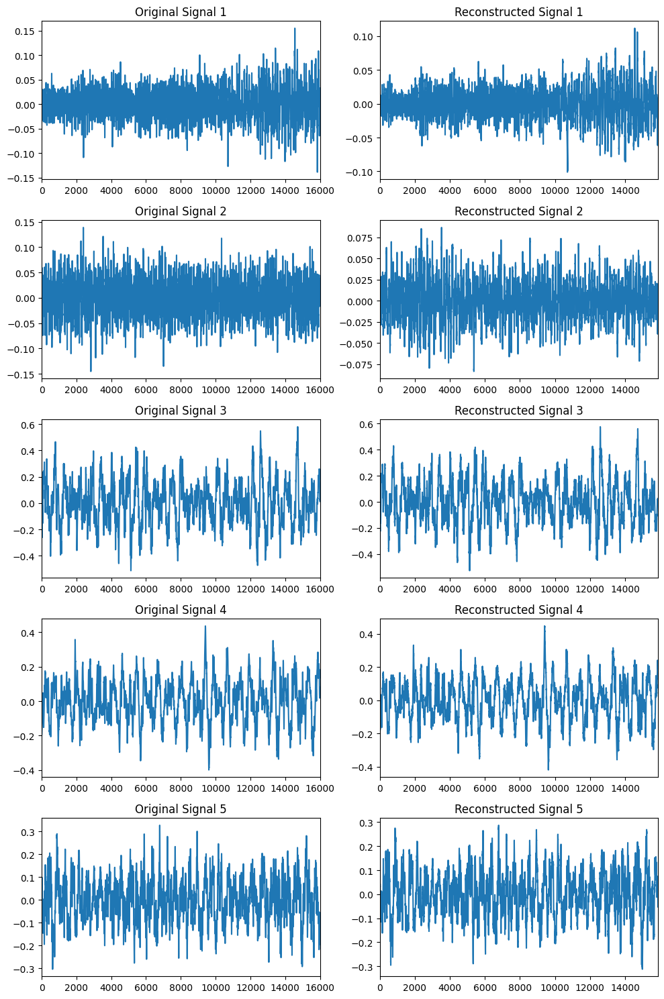

Epoch [611/1001], Loss: 0.000387
Epoch [621/1001], Loss: 0.000369
Epoch [631/1001], Loss: 0.000360
Epoch [641/1001], Loss: 0.000371
Epoch [651/1001], Loss: 0.000359
Epoch [661/1001], Loss: 0.000354
Epoch [671/1001], Loss: 0.000342
Epoch [681/1001], Loss: 0.000350
Epoch [691/1001], Loss: 0.000336
Epoch [701/1001], Loss: 0.000335


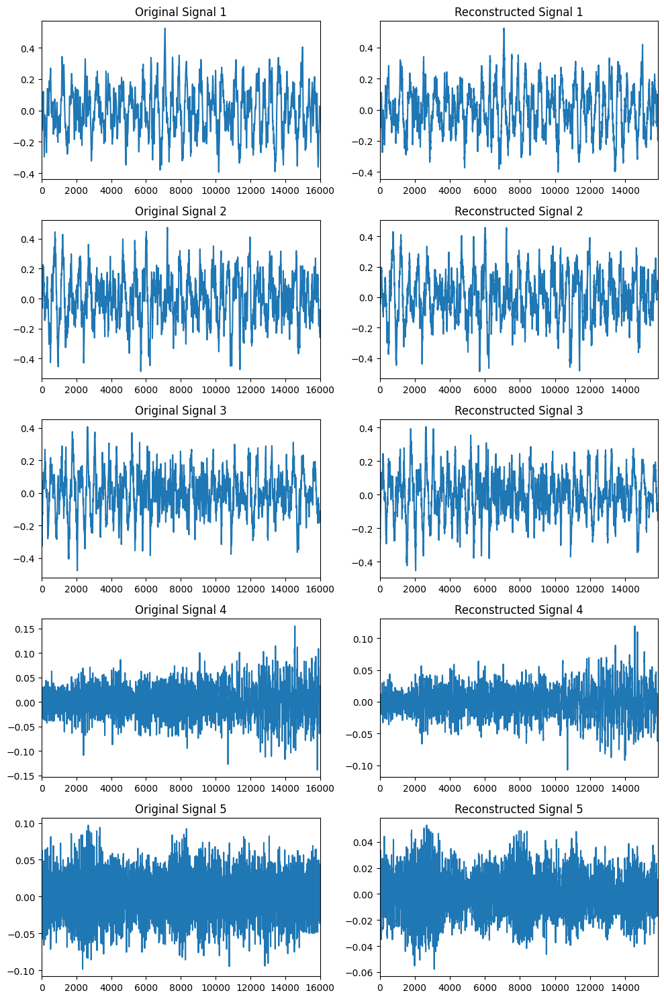

Epoch [711/1001], Loss: 0.000379
Epoch [721/1001], Loss: 0.000363
Epoch [731/1001], Loss: 0.000363
Epoch [741/1001], Loss: 0.000323
Epoch [751/1001], Loss: 0.000311
Epoch [761/1001], Loss: 0.000310
Epoch [771/1001], Loss: 0.000300
Epoch [781/1001], Loss: 0.000296
Epoch [791/1001], Loss: 0.000291
Epoch [801/1001], Loss: 0.000298


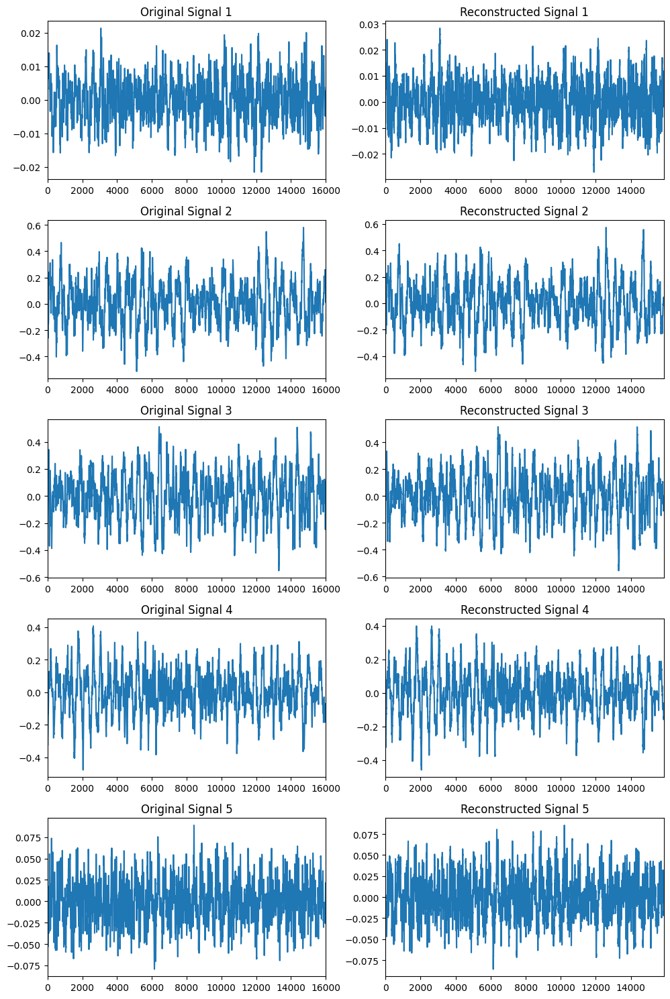

Epoch [811/1001], Loss: 0.000292
Epoch [821/1001], Loss: 0.000289
Epoch [831/1001], Loss: 0.000290
Epoch [841/1001], Loss: 0.000274
Epoch [851/1001], Loss: 0.000279
Epoch [861/1001], Loss: 0.000269
Epoch [871/1001], Loss: 0.000272
Epoch [881/1001], Loss: 0.000259
Epoch [891/1001], Loss: 0.000261
Epoch [901/1001], Loss: 0.000266


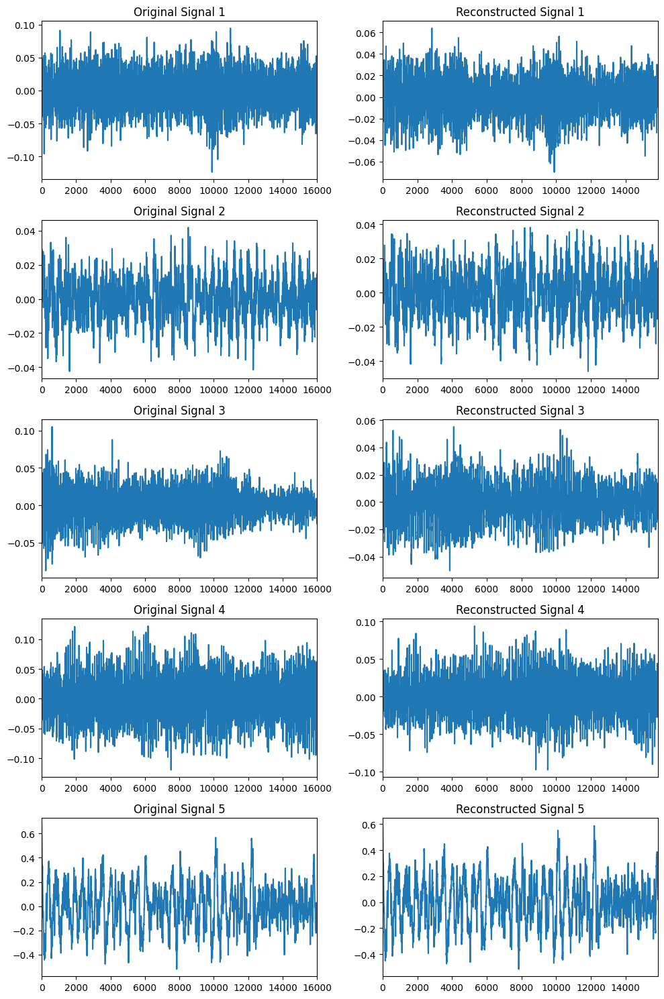

Epoch [911/1001], Loss: 0.000266
Epoch [921/1001], Loss: 0.000245
Epoch [931/1001], Loss: 0.000248
Epoch [941/1001], Loss: 0.000249
Epoch [951/1001], Loss: 0.000241
Epoch [961/1001], Loss: 0.000238
Epoch [971/1001], Loss: 0.000235
Epoch [981/1001], Loss: 0.000239
Epoch [991/1001], Loss: 0.000241
Epoch [1001/1001], Loss: 0.000232


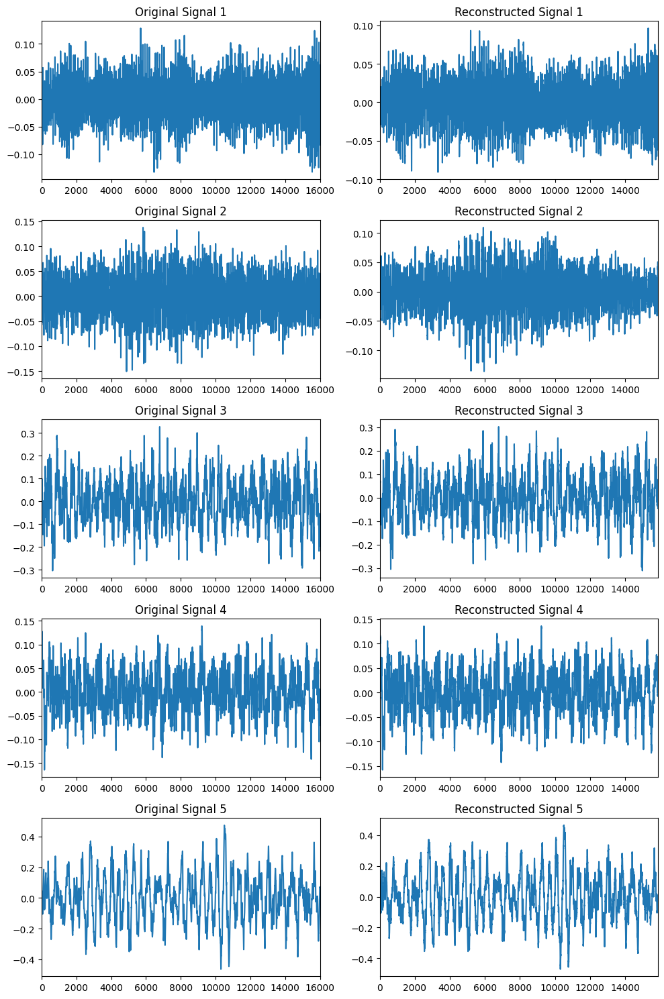

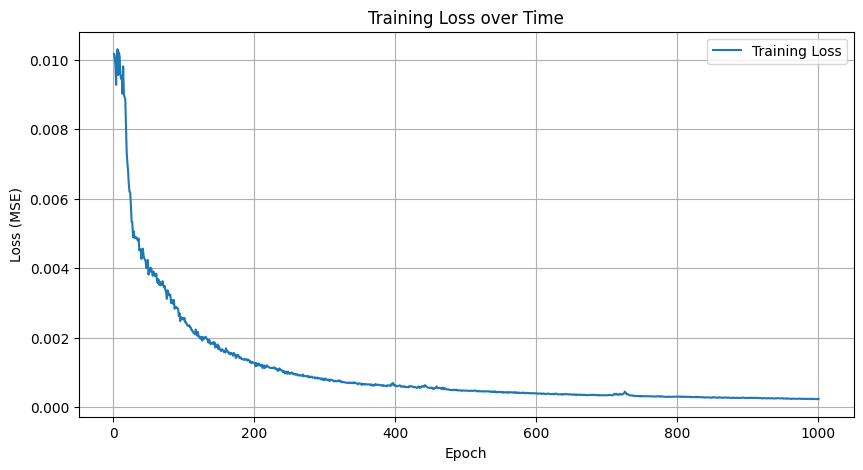

In [4]:
# model training

# Load training audio
audio_signal, sample_rate = read_sound("../sounds/162095-chinese-orchestra-channel-1.wav")

# Create dataset and data loader
segment_length = 16000
dataset = AudioDataset(audio_signal, segment_length)
data_loader = DataLoader(dataset, batch_size=32, shuffle=True)

# Initialize model, loss, optimizer
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = ConvAutoencoder().to(device)

# Train the model
num_epochs = 1001
train_autoencoder(model, data_loader, num_epochs, device)

Original signal size (number of elements): 874006
Shape of latent representation: torch.Size([1, 64, 1708])
Size of latent representation (number of elements): 109312


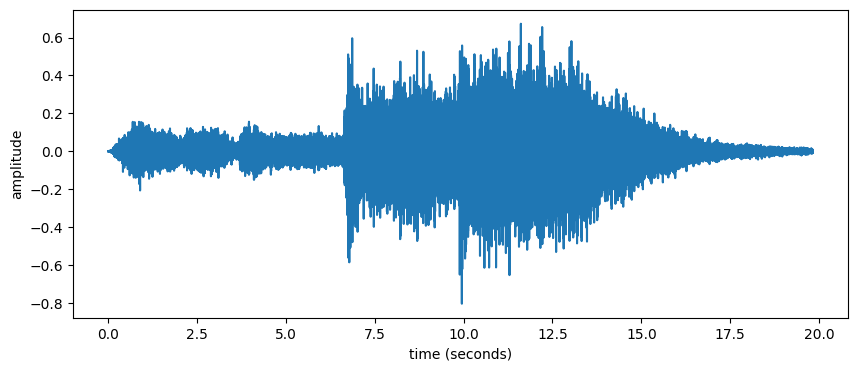

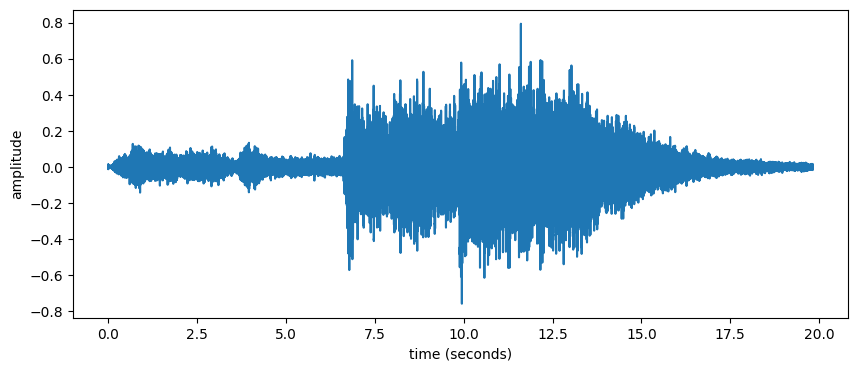

In [5]:
# Encode and decode an audio signal
audio_signal, sample_rate = read_sound("../sounds/162095-chinese-orchestra-channel-1.wav")
latent_rep = encode_audio(model, audio_signal, device)
reconstructed_signal = decode_audio(model, latent_rep, device)

# Original signal (in NumPy)
print(f"Original signal size (number of elements): {audio_signal.size}")
# Print the shape of the latent representation
print(f"Shape of latent representation: {latent_rep.shape}")
# Print the total number of elements in the latent representation
print(f"Size of latent representation (number of elements): {latent_rep.numel()}")

# Plot and play original and reconstructed signal
display_sound(audio_signal, sample_rate)
display_sound(reconstructed_signal, sample_rate)

Original signal size (number of elements): 874006
Shape of latent representation: torch.Size([1, 64, 1708])
Size of latent representation (number of elements): 109312


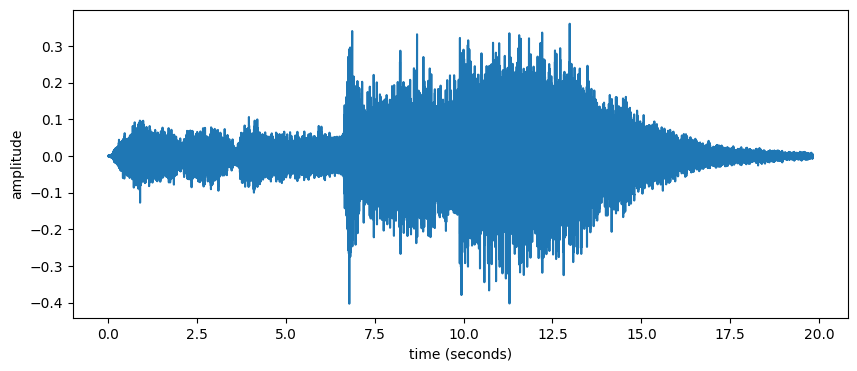

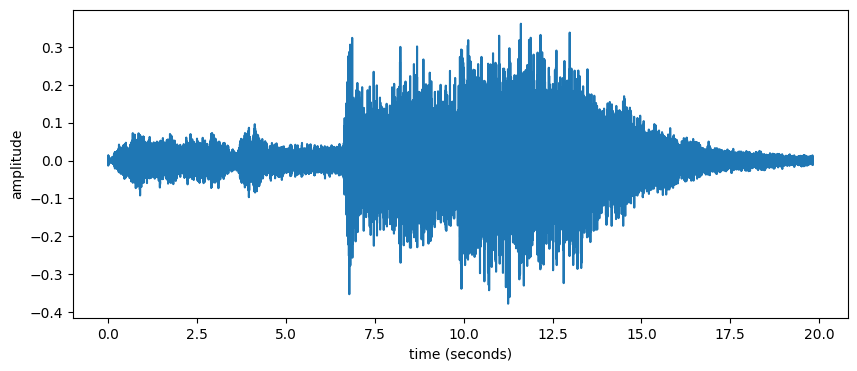

In [6]:
# Encode and decode an audio signal
audio_signal, sample_rate = read_sound("../sounds/162095-chinese-orchestra-channel-2.wav")
latent_rep = encode_audio(model, audio_signal, device)
reconstructed_signal = decode_audio(model, latent_rep, device)

# Original signal (in NumPy)
print(f"Original signal size (number of elements): {audio_signal.size}")
# Print the shape of the latent representation
print(f"Shape of latent representation: {latent_rep.shape}")
# Print the total number of elements in the latent representation
print(f"Size of latent representation (number of elements): {latent_rep.numel()}")

# Plot and play original and reconstructed signal
display_sound(audio_signal, sample_rate)
display_sound(reconstructed_signal, sample_rate)

Original signal size (number of elements): 112076
Shape of latent representation: torch.Size([1, 64, 219])
Size of latent representation (number of elements): 14016


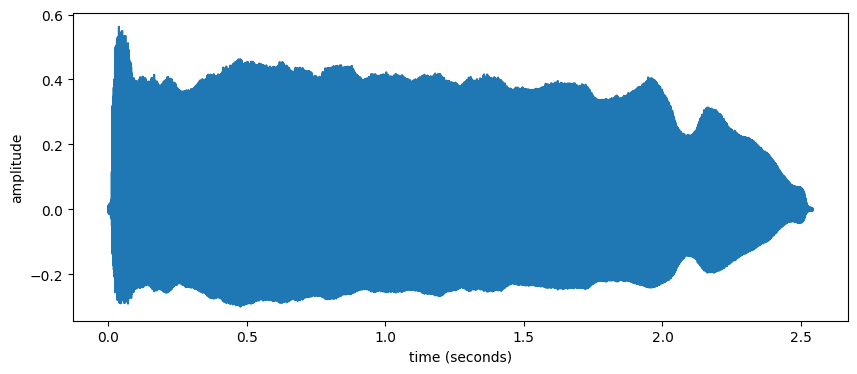

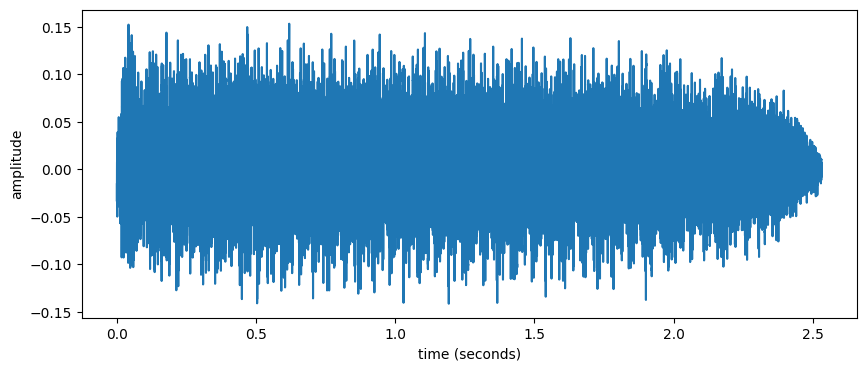

In [7]:
# Encode and decode an audio signal
audio_signal, sample_rate = read_sound("../sounds/487465-trumpet.wav")
latent_rep = encode_audio(model, audio_signal, device)

# Original signal (in NumPy)
print(f"Original signal size (number of elements): {audio_signal.size}")
# Print the shape of the latent representation
print(f"Shape of latent representation: {latent_rep.shape}")
# Print the total number of elements in the latent representation
print(f"Size of latent representation (number of elements): {latent_rep.numel()}")

reconstructed_signal = decode_audio(model, latent_rep, device)

# Plot and play original and reconstructed signal
display_sound(audio_signal, sample_rate)
display_sound(reconstructed_signal, sample_rate)

In [10]:
from torchinfo import summary

# Print the model summary
summary(model, input_size=(1, 16000))  # Input size: (Channels, Length)

Layer (type:depth-idx)                   Output Shape              Param #
ConvAutoencoder                          [1, 15874]                --
├─Sequential: 1-1                        [64, 32]                  --
│    └─Conv1d: 2-1                       [1024, 32]                2,098,176
│    └─ReLU: 2-2                         [1024, 32]                --
│    └─Conv1d: 2-3                       [256, 32]                 262,400
│    └─ReLU: 2-4                         [256, 32]                 --
│    └─Conv1d: 2-5                       [64, 32]                  16,448
│    └─ReLU: 2-6                         [64, 32]                  --
├─Sequential: 1-2                        [1, 15874]                --
│    └─ConvTranspose1d: 2-7              [256, 32]                 16,640
│    └─ReLU: 2-8                         [256, 32]                 --
│    └─ConvTranspose1d: 2-9              [1024, 32]                263,168
│    └─ReLU: 2-10                        [1024, 32]         